In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        pass
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
import pandas as pd

import os
# import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from wordcloud import WordCloud, STOPWORDS

#Text Color
from termcolor import colored

#Data Preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

#NLP
# from sklearn.feature_extraction.text import CountVectorizer

#WordCloud
from wordcloud import WordCloud, STOPWORDS

#Text Processing
import re
import nltk
nltk.download('popular')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk

True

In [3]:
train = pd.read_csv('/kaggle/input/shopee-product-matching/train.csv')
test = pd.read_csv('/kaggle/input/shopee-product-matching/test.csv')
sample = pd.read_csv('/kaggle/input/shopee-product-matching/sample_submission.csv')

In [4]:
train_jpg_diretory = '/kaggle/input/shopee-product-matching/train_images'
test_jpg_diretory = '/kaggle/input/shopee-product-matching/test_images'

In [5]:
def getImagePaths(path):
    image_names = []
    
    for dirname, _, filenames in os.walk(path):
        for f in filenames:
            fullpath = os.path.join(dirname, f)
            image_names.append(fullpath)
            
    return image_names

In [6]:
train_images_path = getImagePaths(train_jpg_diretory)
test_images_path = getImagePaths(test_jpg_diretory)

In [8]:
data_dir = '/kaggle/input/shopee-product-matching/train_images'
train.loc[:, 'file_path'] = train.image.apply(lambda x: os.path.join(data_dir, x))

In [9]:
train.head()

,posting_id,image,image_phash,title,label_group,file_path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,/kaggle/input/shopee-product-matching/train_im...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,/kaggle/input/shopee-product-matching/train_im...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,/kaggle/input/shopee-product-matching/train_im...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,/kaggle/input/shopee-product-matching/train_im...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,/kaggle/input/shopee-product-matching/train_im...


In [8]:
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.3+ MB


In [10]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   3 non-null      object
 1   image        3 non-null      object
 2   image_phash  3 non-null      object
 3   title        3 non-null      object
dtypes: object(4)
memory usage: 224.0+ bytes


In [11]:
print(f"Training Data shape: {colored(train.shape, 'yellow')}")
print(f"Testing Data shape: {colored(test.shape, 'yellow')}")

Training Data shape: (34250, 5)
Testing Data shape: (3, 4)


In [12]:
for col in train.columns:
    print(col + ":" + colored(train.loc[:, col].nunique(), 'yellow'))

posting_id:34250
image:32412
image_phash:28735
title:33117
label_group:11014


In [13]:
first = cv2.imread(train_images_path[0])
dim = np.shape(first)
dim

(640, 640, 3)

In [14]:
np.min(first), np.max(first)

(0, 255)

In [13]:
def display_multiple_img(images_paths, rows, cols):
    figure, ax = plt.subplots(nrows = rows, ncols = cols, figsize = (16, 8))
    ax = ax.flatten()
    
    for i, path in enumerate(images_paths):
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        
        try:
            ax[i].imshow(image)
            ax[i].set_axis_off()
            
        except:
            continue
        
    plt.tight_layout()
    plt.show()

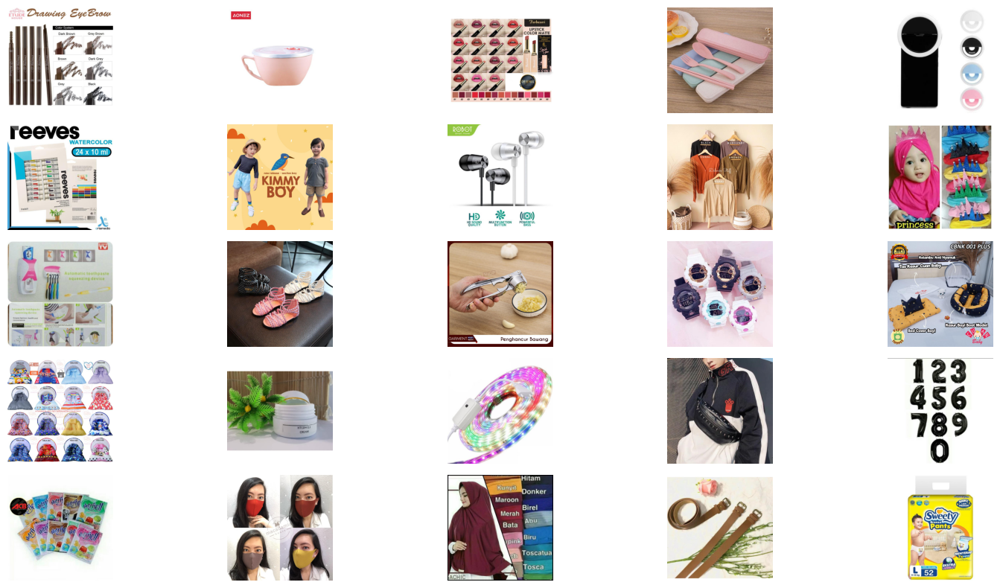

In [14]:
display_multiple_img(train_images_path[100:125], 5, 5)

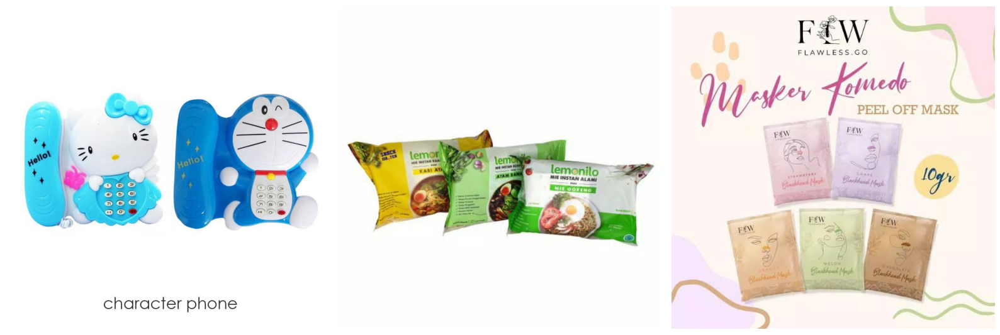

In [15]:
display_multiple_img(test_images_path, 1, 3)

In [16]:
def group_path(group, m):
    path = '/kaggle/input/shopee-product-matching/train_images/'
    
    if m == 'l':
        tmp = train.image[train.label_group == group].values
        
    elif m == 't':
        tmp = train.image[train.title == group].values
        
    image_names = []
    
    for f in tmp:
        fullpath = os.path.join(path, f)
        image_names.append(fullpath)
    
    return image_names

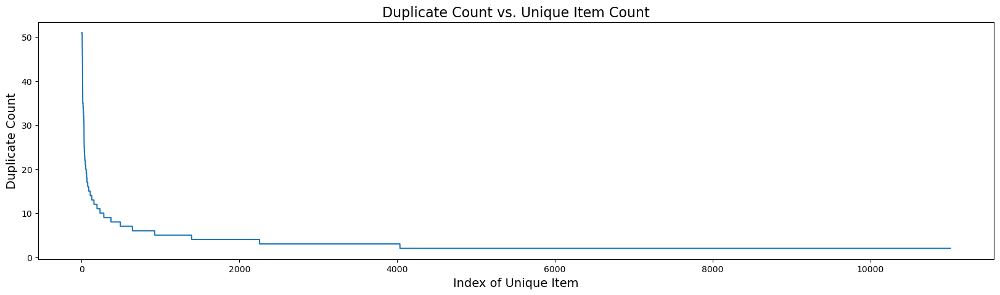

In [17]:
train_labels_count = train.label_group.value_counts()

plt.figure(figsize = (20, 5))
plt.plot(np.arange(train_labels_count.shape[0]), train_labels_count.values)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Index of Unique Item',size=14)
plt.title('Duplicate Count vs. Unique Item Count',size=16)
plt.show()

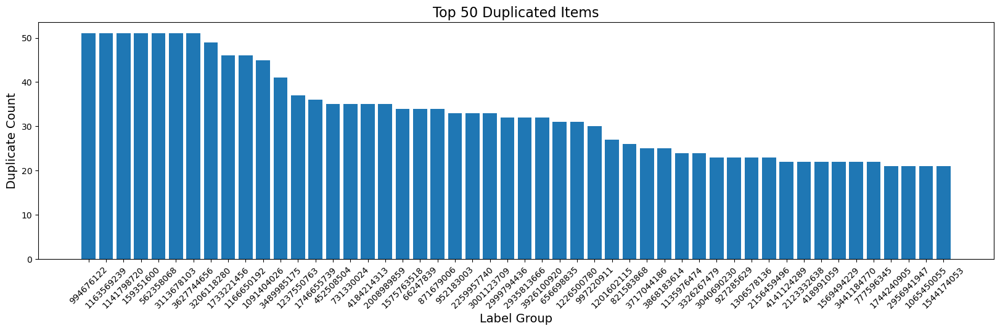

In [18]:
plt.figure(figsize = (20, 5))
plt.bar(train_labels_count.index[:50].values.astype('str'), train_labels_count.values[:50])
plt.xticks(rotation = 45)
plt.ylabel('Duplicate Count',size=14)
plt.xlabel('Label Group',size=14)
plt.title('Top 50 Duplicated Items',size=16)
plt.show()

In [19]:
train_labels_count = train.label_group.value_counts()
most_freq = train_labels_count[train_labels_count == train_labels_count.max()]
less_freq = train_labels_count[train_labels_count == train_labels_count.min()]

print(most_freq.index)
print(less_freq.index)

Int64Index([994676122, 1163569239, 1141798720, 159351600, 562358068,
            3113678103, 3627744656],
           dtype='int64')
Int64Index([2257273889, 1668821299,  260834849, 2068568869, 1316653731,
            3280718287, 1800260056,  748669332, 2607297170, 3662309699,
            ...
            1395102007, 3907914144,  257292447,  406412315, 2547455009,
            1349674444, 2359590024, 1528129430, 3156068330,   53836859],
           dtype='int64', length=6979)


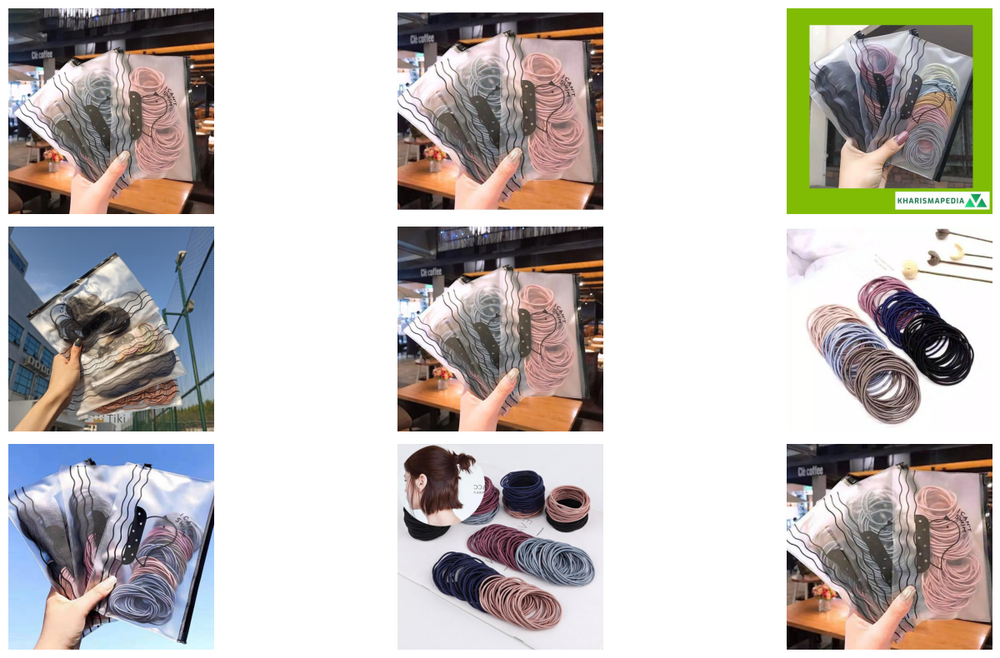

In [20]:
lg = most_freq.index[0]
display_multiple_img(group_path(lg, 'l'), 3, 3)

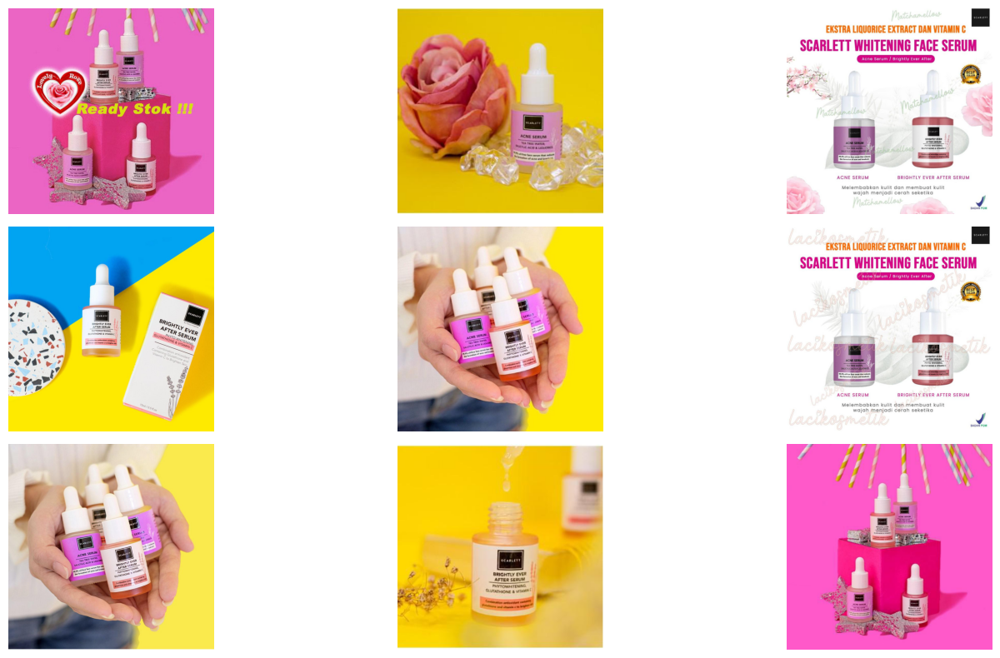

In [21]:
lg = most_freq.index[1]
display_multiple_img(group_path(lg, 'l'), 3, 3)

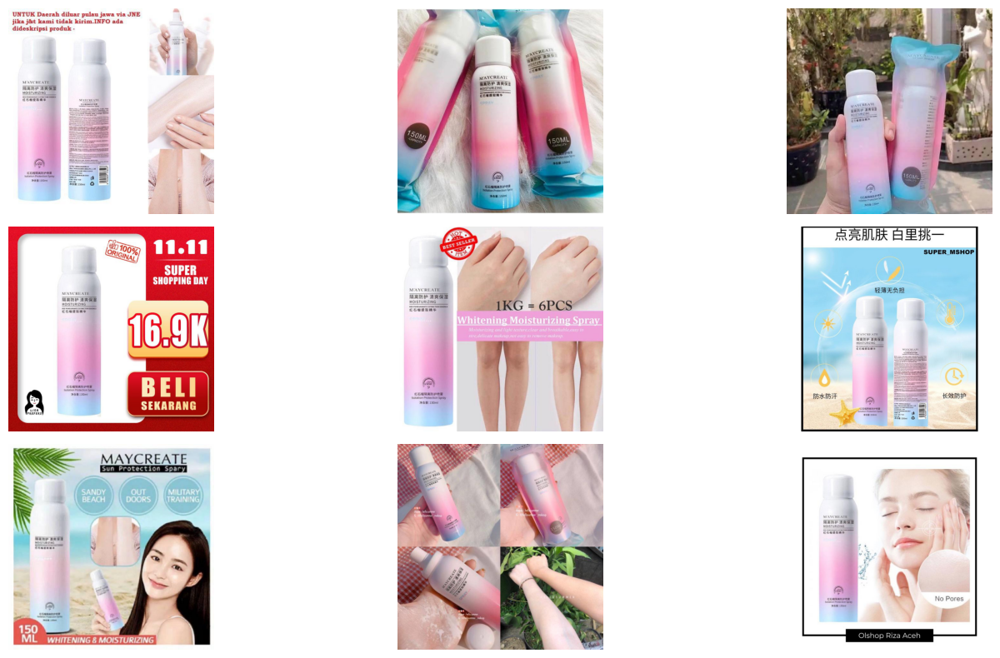

In [22]:
lg = most_freq.index[2]
display_multiple_img(group_path(lg, 'l'), 3, 3)

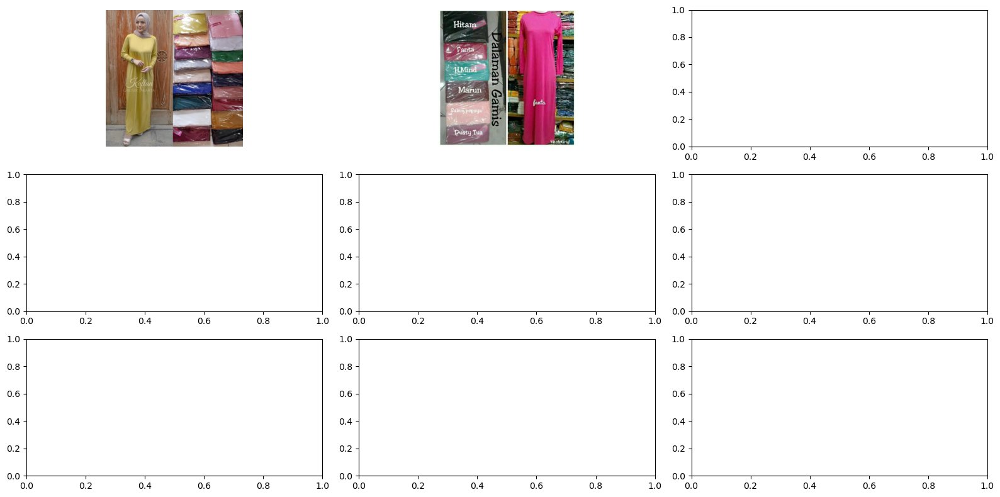

In [23]:
lg = less_freq.index[0]
display_multiple_img(group_path(lg, 'l'), 3, 3)

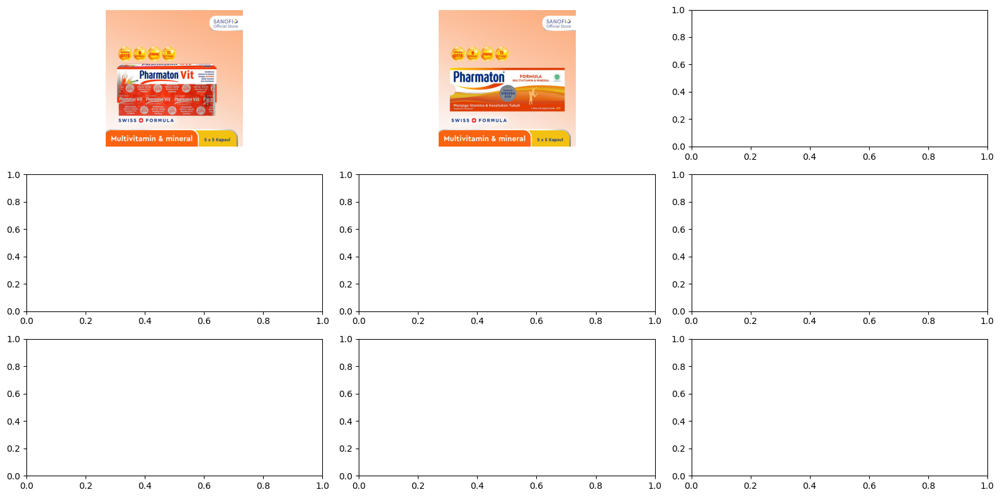

In [24]:
lg = less_freq.index[1]
display_multiple_img(group_path(lg, 'l'), 3, 3)

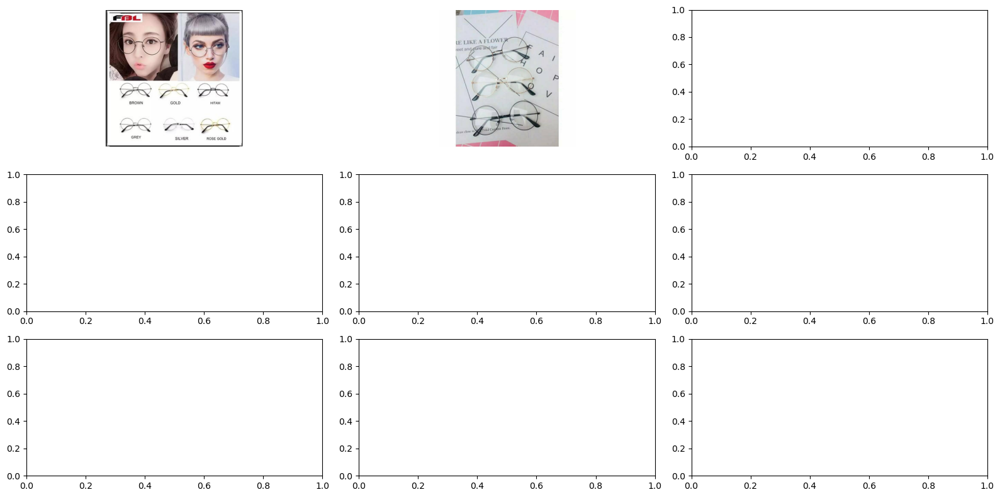

In [25]:
lg = less_freq.index[2]
display_multiple_img(group_path(lg, 'l'), 3, 3)

In [26]:
titles_count = train.title.value_counts().sort_values(ascending = False).reset_index()
titles_count.columns = ['title', 'count']
titles_count.head(10)

,title,count
0,Koko syubbanul muslimin koko azzahir koko baju,9
1,Baju Koko Pria Gus Azmi Syubbanul Muslimin Kom...,8
2,Viva Air Mawar,6
3,Monde Boromon Cookies 1 tahun+ 120gr,6
4,100 Pcs Ikat Rambut Karet Polos Elastis Gaya K...,6
5,Emina Glossy Stain,6
6,Shannen lipstik shanen creamy lip paint,5
7,Wardah Everyday Fruity Sheer Lip Balm Strawber...,5
8,24Pc False Nail Art tips Matte Nude Coffin Bal...,5
9,Avoskin Miraculous Retinol Toner,5


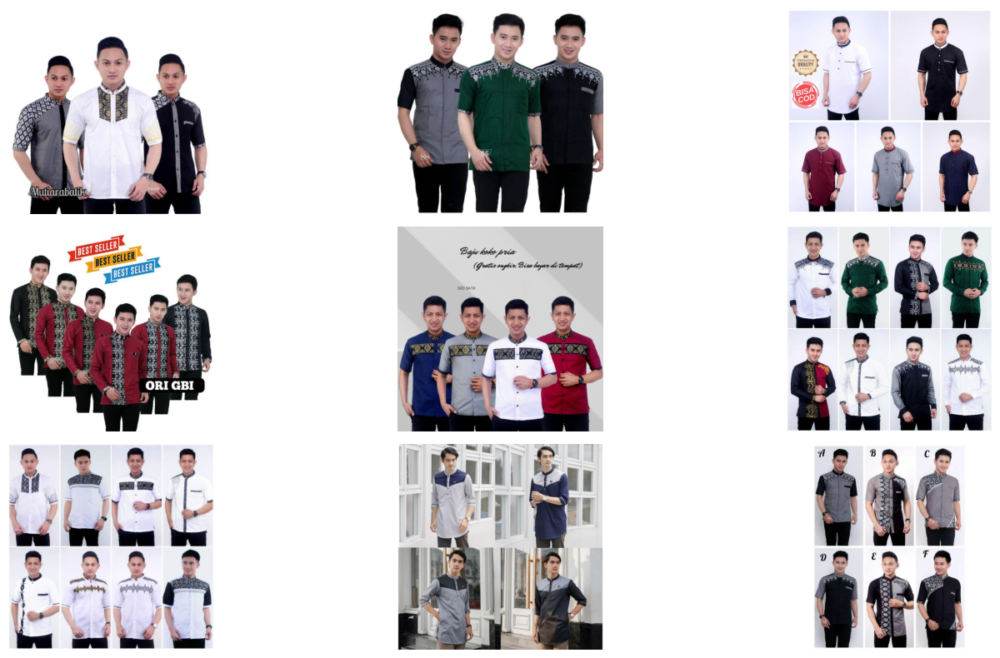

In [27]:
img_title = titles_count.title[0]
display_multiple_img(group_path(img_title, 't'), 3, 3)

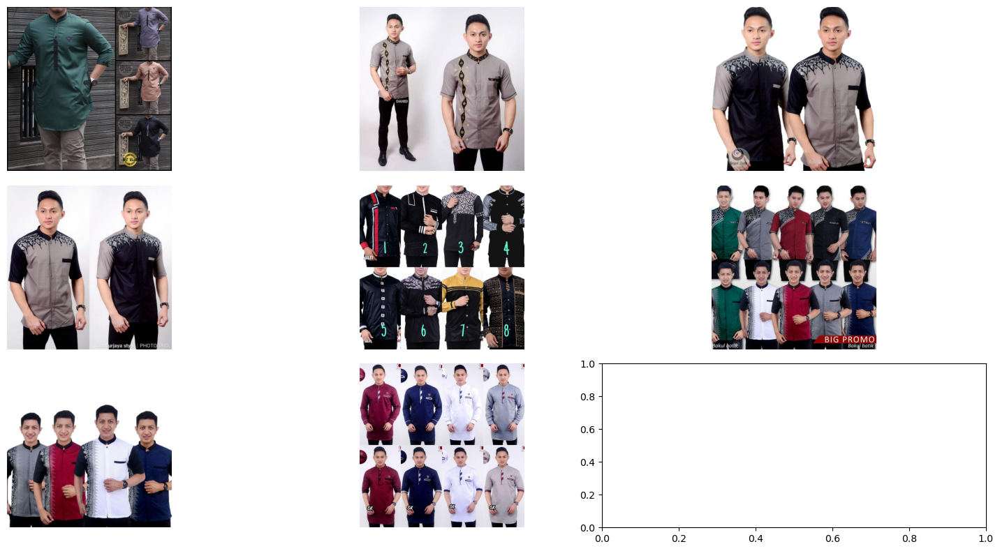

In [28]:
img_title = titles_count.title[1]
display_multiple_img(group_path(img_title, 't'), 3, 3)

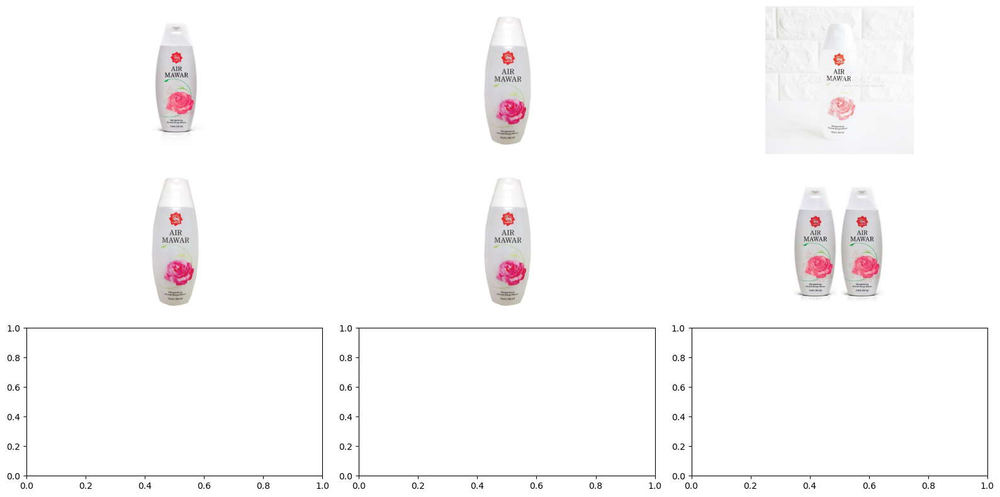

In [29]:
img_title = titles_count.title[2]
display_multiple_img(group_path(img_title, 't'), 3, 3)

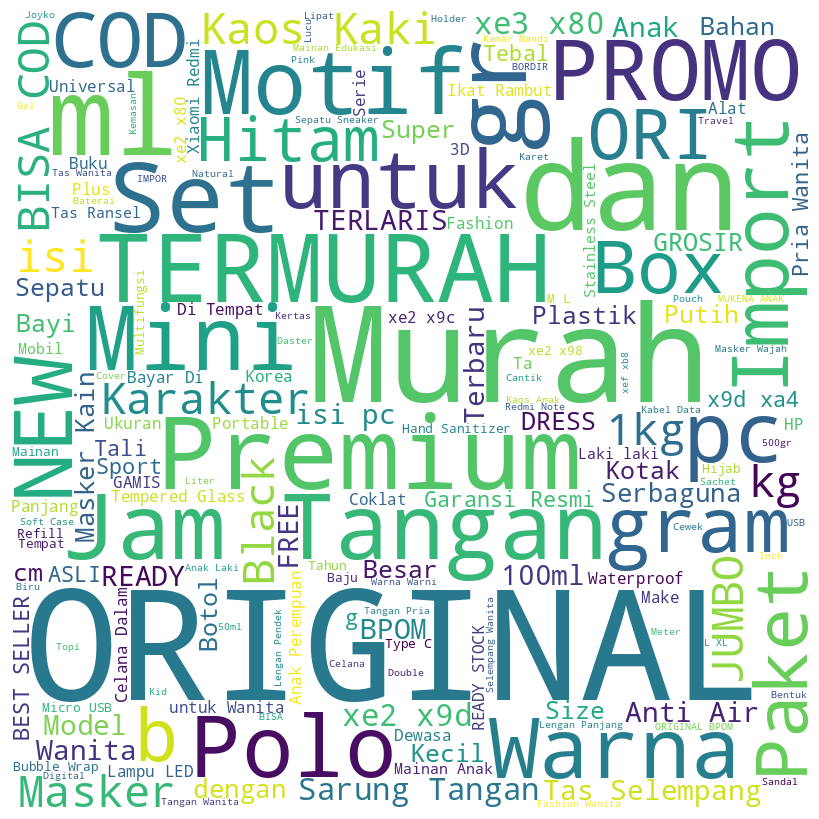

In [30]:
stopwords = set(STOPWORDS)
wordcloud = WordCloud(width = 800, height = 800, min_font_size = 10, background_color ='white', stopwords = stopwords).generate(' '.join(train.title))

plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

In [52]:
def get_top_n_words(corpus, n = None):
    vectorizer = CountVectorizer()
    bags_of_words = vectorizer.fit_transform(corpus)
    sum_words = bags_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    
    return words_freq[:n]

def get_top_n_bigram(corpus, n = None):
    vectorizer = CountVectorizer(ngram_range = (2, 2))
    bags_of_words = vectorizer.fit_transform(corpus)
    sum_words = bags_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    
    return words_freq[:n]

def get_top_n_trigram(corpus, n = None):
    vectorizer = CountVectorizer(ngram_range = (3, 3))
    bags_of_words = vectorizer.fit_transform(corpus)
    sum_words = bags_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    
    return words_freq[:n]

In [50]:
def plot_bt(func, gram, palette):
    common_words = func(train.title, 20)
    df = pd.DataFrame(common_words, columns = ['word', 'freq'])
    
    plt.figure(figsize = (16, 10))
    sns.barplot(x = 'freq', y = 'word', palette = palette, data = df)
    plt.title("Top 20 "+ gram)
    plt.xlabel("Frequency", fontsize=14)
    plt.yticks(fontsize=13)
    plt.xticks(rotation=45, fontsize=13)
    plt.ylabel("");
    
    plt.show()

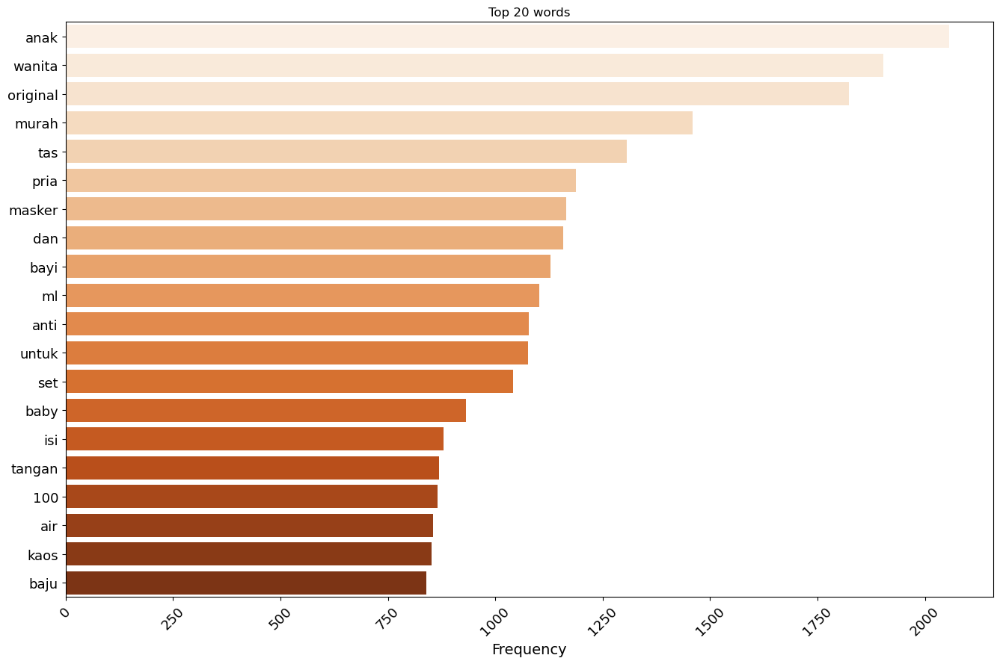

In [53]:
plot_bt(get_top_n_words, "words", "Oranges")

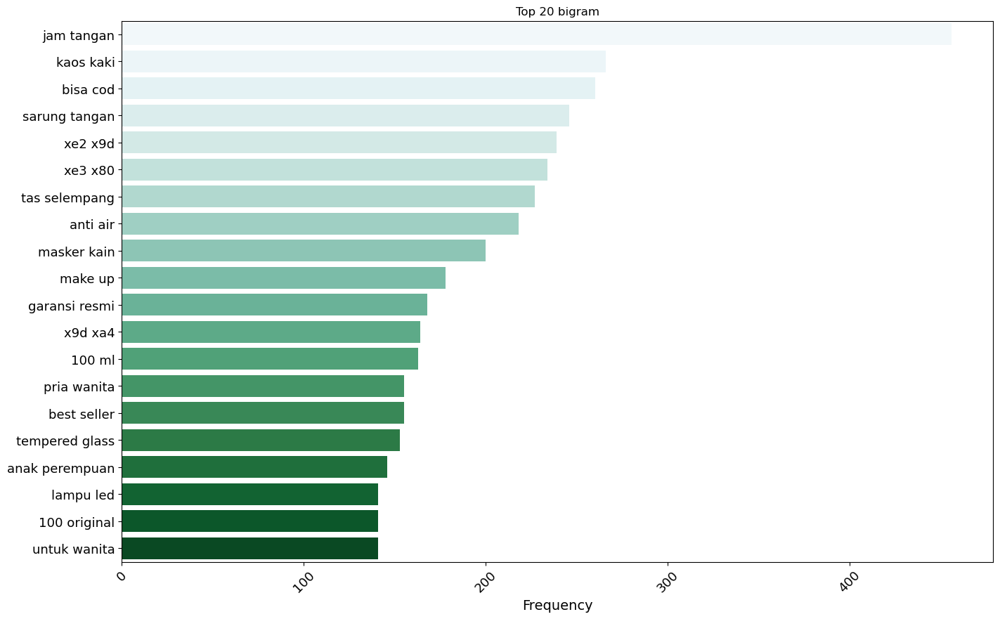

In [54]:
plot_bt(get_top_n_bigram, "bigram", "BuGn")

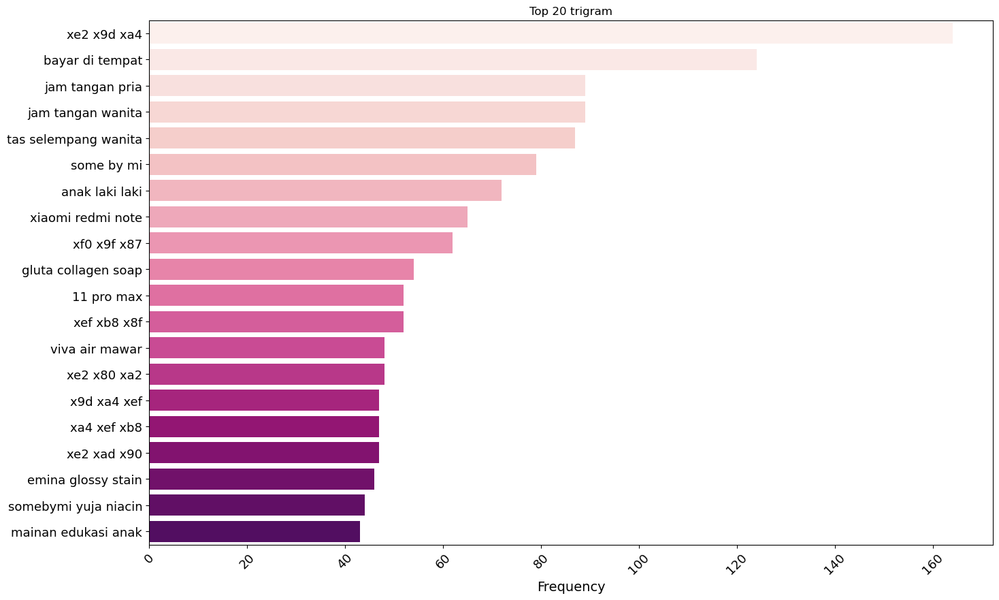

In [55]:
plot_bt(get_top_n_trigram, "trigram", "RdPu")

In [10]:
import cuml, cudf, cupy
from cuml.feature_extraction.text import CountVectorizer, TfidfVectorizer
from cuml.neighbors import NearestNeighbors

In [14]:
train_gpu = cudf.from_dataframe(train, allow_copy = True)
train_gpu.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [16]:
STOPWORDS = nltk.corpus.stopwords.words('english')

punctuation = [ '!', '"', '#', '$', '%', '&', '(', ')', '*', '+', '-', '.', '/',  '\\', ':', ';', 
               '<', '=', '>','?', '@', '[', ']', '^', '_', '`', '{', '|', '}', '\t','\n',"'",",",
               '~' , '—']

In [19]:
def text_preprocessing(input_text, filters = None, stopwords = STOPWORDS):
    translate_table = {ord(char): ord(' ') for char in filters}
    
    input_text = input_text.str.translate(translate_table)
    input_text = input_text.str.lower()
    
    stopwords_gpu= cudf.Series(stopwords)
    input_text = input_text.str.replace_tokens(stopwords_gpu, ' ')
    input_text = input_text.str.normalize_spaces()
    input_text = input_text.str.strip(' ')
    
    return input_text

def preprocess_df(df, col, **kwargs):
    df[col] = text_preprocessing(df[col], **kwargs)
    
    return df

In [20]:
train_gpu = preprocess_df(train_gpu, 'title', filters = punctuation)
train_gpu.head(10)

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,paper bag victoria secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,double tape 3m vhb 12 mm x 4 5 original double...,2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,maling tts canned pork luncheon meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,daster batik lengan pendek motif acak campur l...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,nescafe xc3 x89clair latte 220ml,3648931069
5,train_2464356923,0013e7355ffc5ff8fb1ccad3e42d92fe.jpg,bbd097a7870f4a50,celana wanita bb 45 84 kg harem wanita bisa cod,2660605217
6,train_1802986387,00144a49c56599d45354a1c28104c039.jpg,f815c9bb833ab4c8,jubah anak size 1 12 thn,1835033137
7,train_1806152124,0014f61389cbaa687a58e38a97b6383d.jpg,eea7e1c0c04da33d,kulot plisket salur candy plisket wish kulot p...,1565741687
8,train_86570404,0019a3c6755a194cb2e2c12bfc63972e.jpg,ea9af4f483249972,logu tempelan kulkas magnet angka tempelan ang...,2359912463
9,train_831680791,001be52b2beec40ddc1d2d7fc7a68f08.jpg,e1ce953d1a70618f,big sale sepatu pantofel kulit keren kerja kan...,2630990665


In [21]:
train_gpu.to_csv('title_preprocessed_dataset.csv')

In [22]:
vec = CountVectorizer(stop_words = 'english', binary = True)
tmp = vec.fit_transform(train_gpu.title).toarray()

In [15]:
model = TfidfVectorizer(stop_words = 'english', binary = True)
tmp = model.fit_transform(train_gpu.title).toarray()

In [16]:
knn = NearestNeighbors(n_neighbors = 50)
knn.fit(tmp)
distances, indices = knn.kneighbors(tmp)

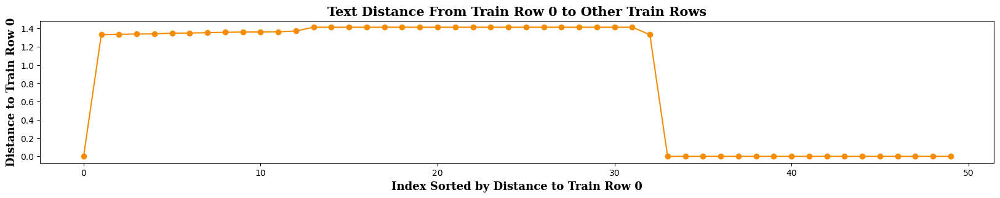

                                                  title  label_group
0                             Paper Bag Victoria Secret    249114794
258   KERANJANG BAJU LAUNDRY LIPAT SERBAGUNA CANVAS ...    523074739
977   Tote bag wanita LUCK FOR YOU / Tote bag wanita...   2375956477
565   MORYMONY BTS - Tas Ransel Backpack Fashion Wan...   2672117886
602   Bamboo Storage Box Bag Organizer Tempat Penyim...   3195941759
600   Miniso Official Stylish Simple Handbag Shoulde...   4133136123
550   Tas Kosmetik Monopoly Travel Make Up Wanita Ba...   1010522046
979   Greenland Tas Sepatu Kantong Serut Travelling ...   1995081921
1532  JOYSEUS Tragbare Digital Storage Bag / Tas Kab...   2729517986
80    Totebag tote bag BTS BT21 Cooky Koya Mang Chim...   2669812524


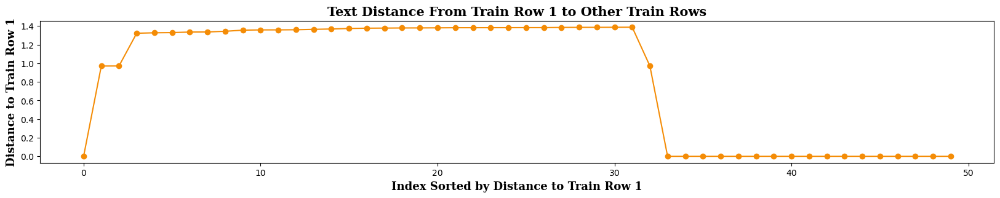

                                                 title  label_group
1    Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...   2937985045
194  3M VHB Double Tape Automotive 4900 tebal 1.1 m...   2819310070
469  3M VHB Double Tape Automotive 4900 tebal 1.1 m...   2819310070
405           SOFTLENS NAVYLENS 15 MM by OMEGA EYECARE   2625952212
44           SENKA Perfect Whip Facial Foam (Shiseido)   1039178864
197    MamyPoko Perekat Royal Soft - L 62 - Popok Tape   2828399909
6                             Jubah anak size 1-12 thn   1835033137
229        SELSUN Yellow Double Impact 100ml / Shampoo   3346361757
372        Masker hijab tali karet lusinan /isi 12 pcs   2675366031
425        Pensil Warna Faber Castell Grip 12 Triangle   2091479370


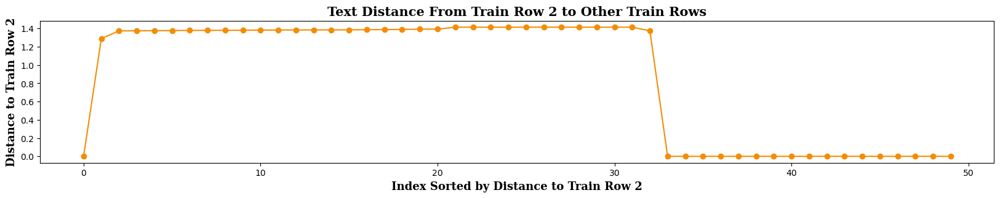

                                                 title  label_group
2          Maling TTS Canned Pork Luncheon Meat 397 gr   2395904891
205                             M031 Alarm anti maling   1943235893
142                        Nibs Cokelat Kekinian 50 gr   2933975634
453            b"JOHNSON'S Baby Powder Blossom 300 gr"    359468572
192                            Tango Long Wafer 130 gr   3907091402
701                       Knots Chocolate 55 gr - GIFT    784537567
259  Pepsodent Sensitive Expert Whitening 100 gr / ...    690243940
182          MASKER KOMEDO  GELATIN by PICNIC.ID 10 gr    217263041
17   Saffron 0,25 gr s.d 2 gr Super Negin Premium Q...   2353399596
20              Safi Dermasafe Night Moisturiser 50 gr   3624674138


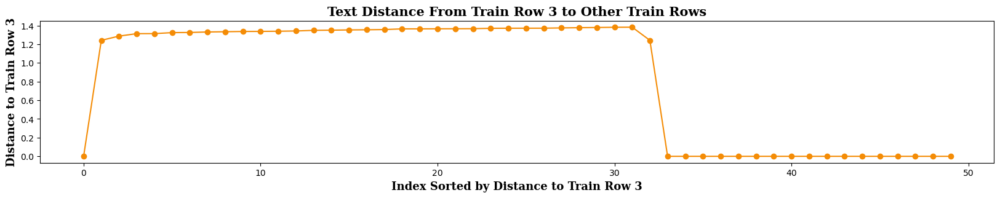

                                                 title  label_group
3    Daster Batik Lengan pendek - Motif Acak / Camp...   4093212188
761                 Kemeja Surfing Motif Lengan Pendek   2859794542
103  DASTER KATUN KARTUN KARAKTER / DRESS WANITA BUSUI   1773396944
296      Daster Manohara Panjang Motif Daun Etnik Bali   2278982980
77   BSB gantungan hp strap phone tali leher motif ...    981370797
485  Setelan koko anak cowok list mode | baju koko ...   3974991115
513                        DASTER PANJANG REMPEL BUSUI   1354996102
696  Dress Salur Malone II Lengan Pendek - Miss.Sim...    478812549
566    Map plastik kancing/ map kancing punggung Folio    721918808
506                                BATIK MARTAKA PENNA    961933415


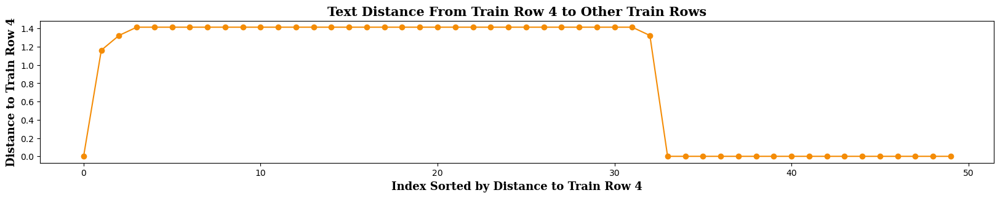

                                                 title  label_group
4                    Nescafe \xc3\x89clair Latte 220ml   3648931069
252                                    Nescafe classic   3030935442
671  Lakm\xc3\xa9 Make Up Lipstick Matte Classics R...   2497751413
101       COMOTOMO PINK/GREEN 150ML SINGLE PACK BOTTLE   1420214137
69                  CUKA APEL BRAGG [MURNI 100% 60 ML]   3798328212
205                             M031 Alarm anti maling   1943235893
201         KAIN STOKING POLOS / NYLON STOCKING FLOWER   1379107134
140        Philips Accessories for Blender - HR2939/55   3614834240
253  FAIR & LOVELY CREAM MOUSTURIZER PELEMBAP WAJAH...    272107103
403  Monellina - G2 - MISBEE Baju Blouse Atasan Ret...   4196173612


In [17]:
for i in range(5):
    plt.figure(figsize = (20, 3))
    plt.plot(np.arange(50), cupy.asnumpy(distances[i, ]), 'o-', color='#f48c06')
    plt.title(f'Text Distance From Train Row {i} to Other Train Rows',fontsize=15, fontweight='bold',horizontalalignment='center',fontfamily='serif')
    plt.ylabel(f'Distance to Train Row {i}',fontsize=13, fontweight='bold',fontfamily='serif')
    plt.xlabel(f'Index Sorted by Distance to Train Row {i}',fontsize=13, fontweight='bold',fontfamily='serif')
    plt.show()
    
    print(train_gpu.loc[indices[i, :10], ['title', 'label_group']])

In [11]:
import torch
import torchvision.models as models
from torchvision.models import get_model
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm.notebook import tqdm
from sklearn.preprocessing import normalize

In [12]:
class ShopeeImageDataset(Dataset):
    def __init__(self, img_path, transform):
        self.img_path = img_path
        self.transform = transform
    
    def __getitem__(self, index):
        img = Image.open(self.img_path[index]).convert('RGB')
        img = self.transform(img)
        
        return img
    
    def __len__(self):
        
        return len(self.img_path)

In [13]:
dataset = ShopeeImageDataset(train.file_path, 
                             transforms.Compose([
                                 transforms.Resize((512, 512)),
                                 transforms.ToTensor(),
                                 transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                             ]))
dataloader = DataLoader(dataset, batch_size = 64, shuffle = False, num_workers = 2)

In [14]:
class ShopeeImageEmbeddingNet(nn.Module):
    def __init__(self):
        super(ShopeeImageEmbeddingNet, self).__init__()
        
        weights = models.ResNet101_Weights.DEFAULT
        model = models.resnet101(weights = weights)
        model.avgpool = nn.AdaptiveMaxPool2d((1, 1))
        model = nn.Sequential(*list(model.children())[:-1])
        model.eval()
        self.model = model
        
    def forward(self, x):
        output = self.model(x)
        
        return output

In [15]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = ShopeeImageEmbeddingNet()
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:01<00:00, 159MB/s]  


In [17]:
img_embedding = []

with torch.no_grad():
    for data in tqdm(dataloader):
        data = data.to(device)
        feature = model(data)
        feature = feature.reshape(feature.shape[0], feature.shape[1])
        feature = feature.data.cpu().numpy()
        
        img_embedding.append(feature)

  0%|          | 0/536 [00:00<?, ?it/s]

In [18]:
img_embedding = np.vstack(img_embedding)
img_embedding = normalize(img_embedding)

In [51]:
img_embedding = cupy.asarray(img_embedding)

In [19]:
knn = NearestNeighbors(n_neighbors = 50)
knn.fit(img_embedding)
distances, indices = knn.kneighbors(img_embedding)

Cluster  75


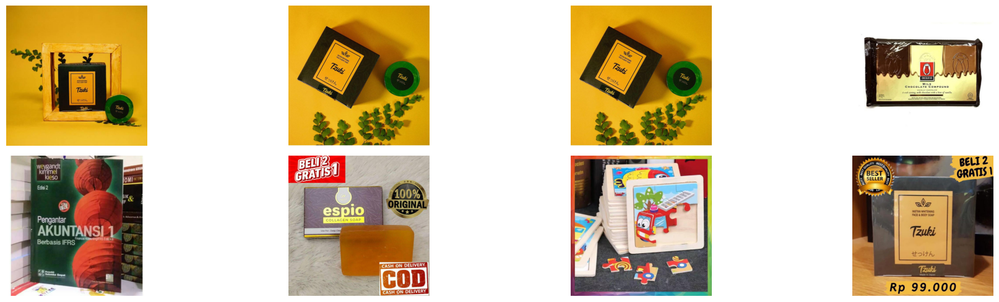

Cluster  76


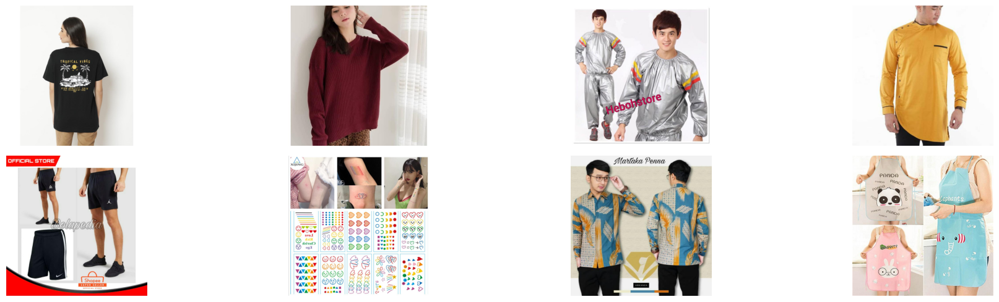

Cluster  77


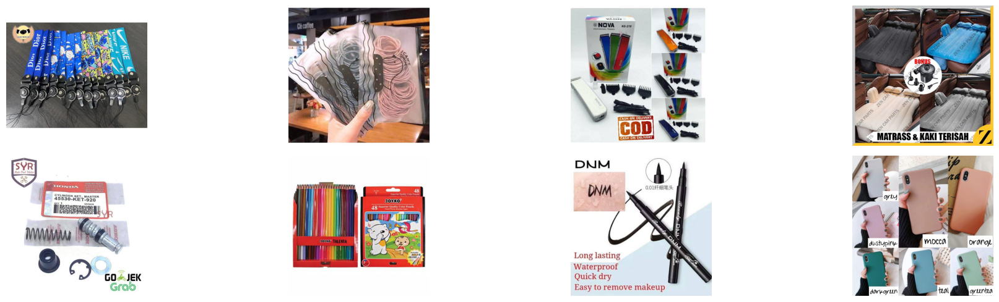

Cluster  78


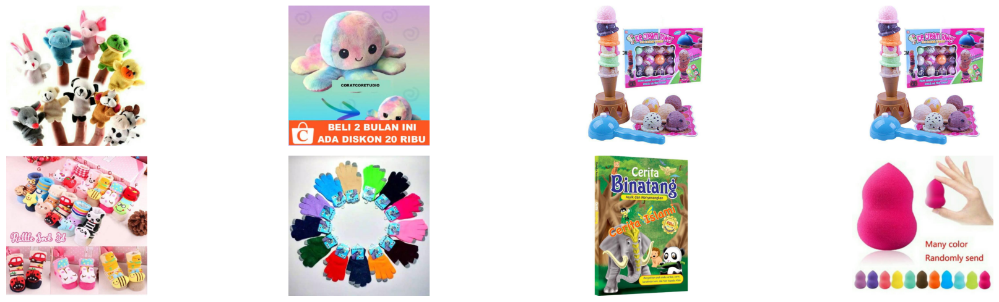

Cluster  79


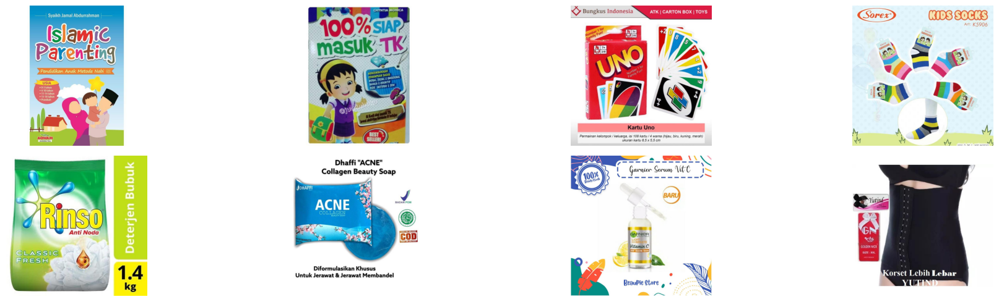

In [20]:
rows = 2
cols = 4

for c in range(75, 80):
    print("Cluster ",c)  
    data = train.loc[cupy.asnumpy(indices[c, :8]), :]
    
    figure, ax = plt.subplots(nrows = rows, ncols = cols, figsize = (20, 5))
    ax = ax.flatten()
    
    for i in range(data.shape[0]):
#         path = os.path.join(train_jpg_diretory, data.iloc[i, 1])
        path = data.iloc[i, -1]
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        
        try:
            ax[i].imshow(image)
            ax[i].set_axis_off()
            
        except:
            continue
    
    plt.tight_layout()
    plt.show()
        